In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import IPython.display as ipd
from scipy.io import wavfile

In [2]:
sample_path = 'Audio/shvabri.wav'

In [3]:
sr, data = wavfile.read(sample_path)

In [4]:
data.shape[0]/sr

50.49469387755102

In [5]:
data.shape

(2226816, 2)

In [6]:
time = np.linspace(0,data.shape[0]/sr,data.shape[0])
time

array([0.00000000e+00, 2.26757471e-05, 4.53514943e-05, ...,
       5.04946485e+01, 5.04946712e+01, 5.04946939e+01])

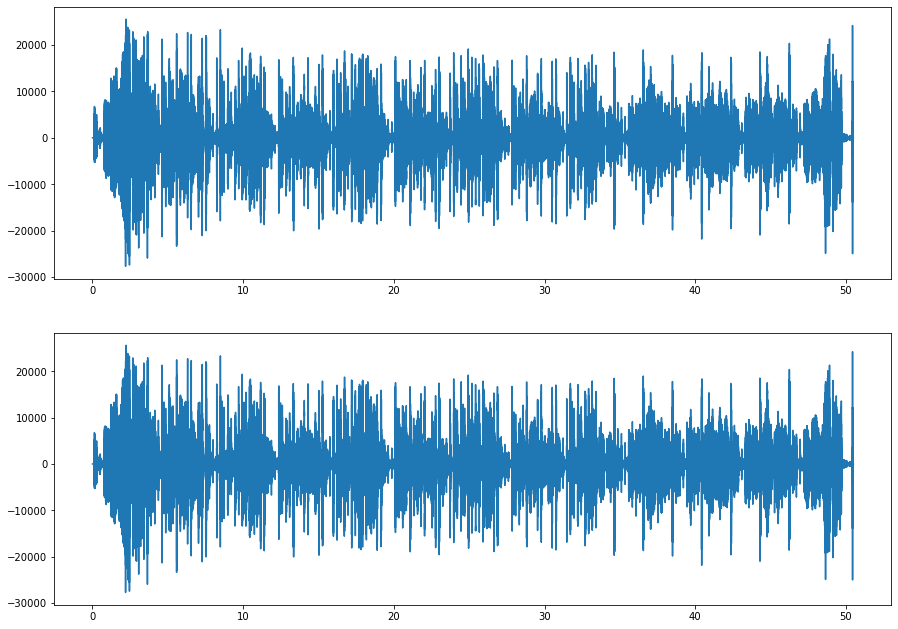

In [7]:
plt.figure(figsize=(15,17))


plt.subplot(3,1,1)
plt.plot(time,data[:,0])
plt.subplot(3,1,2)
plt.plot(time,data[:,1])
plt.show()

In [8]:
#let's use only one channel
sound = data[:,0]

In [9]:
def plot_magnitude_spectrum(signal,title,sr):
    ft = np.fft.fft(signal)
    magnitude_spectrum = np.abs(ft)
    
    plt.figure(figsize = (18,5))
    
    freqs = np.linspace(0,sr,len(sound))
    plt.plot(freqs[:len(freqs)//2],magnitude_spectrum[:len(freqs)//2])
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.show()
    

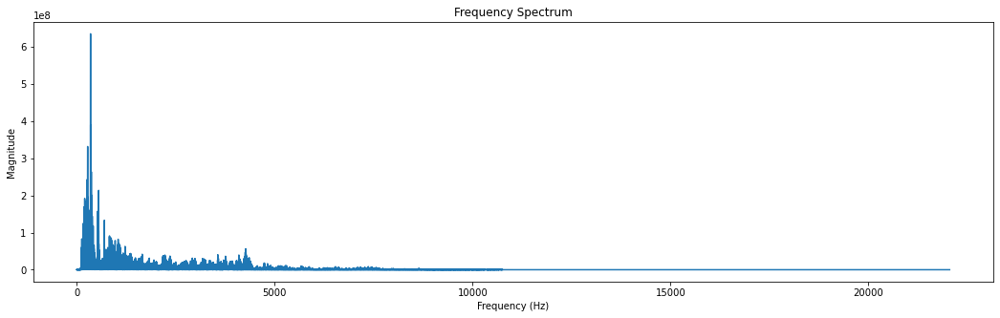

In [10]:
plot_magnitude_spectrum(sound,'Frequency Spectrum',sr)

In [11]:
from scipy.signal import stft, istft

In [12]:
def save_sound(sound, sr, name):
    sound = np.around(sound).astype('int16')
    wavfile.write(name,sr,sound)

In [13]:
nperseg = 256

In [14]:
s_freq, s_time, sxx = stft(sound, sr, nperseg=nperseg, noverlap = nperseg//2)

In [15]:
sxx_abs = (np.abs(sxx))**2

In [16]:
sg_db = 10 * np.log10(sxx_abs+1e-10)

<ipython-input-17-6d57e1c133be>:2: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(s_time, s_freq,  sg_db,cmap='afmhot',vmin = sg_db.min(), vmax = sg_db.max());


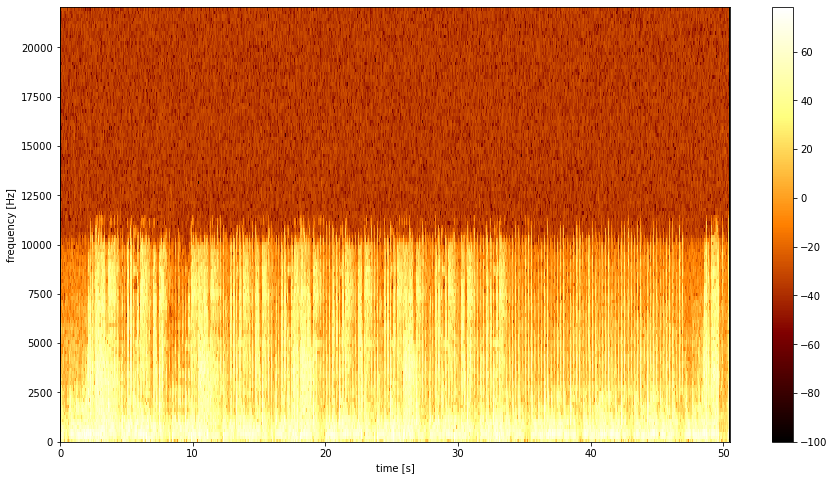

In [17]:
plt.figure(figsize=(15,8))
plt.pcolormesh(s_time, s_freq,  sg_db,cmap='afmhot',vmin = sg_db.min(), vmax = sg_db.max());
plt.ylim([np.min(s_freq),np.max(s_freq)])
plt.xlabel("time [s]")
plt.ylabel("frequency [Hz]")
plt.colorbar()
plt.show()
    

In [18]:
ipd.Audio(sample_path)

In [19]:
from scipy.signal import istft
inv_sound = istft(sxx,sr,nperseg=nperseg, noverlap = nperseg//2)

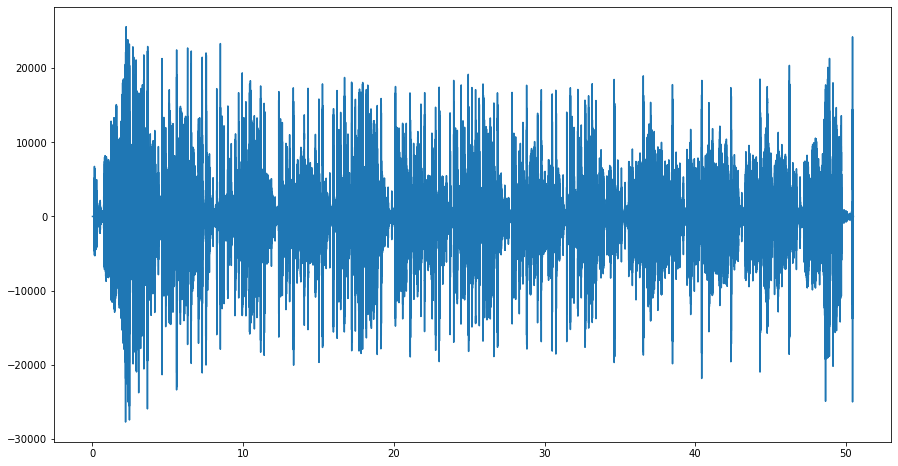

In [20]:
plt.figure(figsize=(15,8))
plt.plot(inv_sound[0],inv_sound[1]);

In [21]:
save_sound(inv_sound[1],sr,'after_stft.wav')